# Notebook3: First Steps into Quantum Computing 

In [1]:
### Import the required packages

from qiskit import QuantumCircuit, transpile
from qiskit.quantum_info import Statevector
from qiskit_aer import AerSimulator
from qiskit_ibm_runtime import QiskitRuntimeService
from qiskit_ibm_runtime import SamplerV2 as Sampler
from qiskit_ibm_runtime import EstimatorV2 as Estimator
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.visualization import plot_histogram

import numpy as np
import qiskit.quantum_info as qi

In [17]:
## Save an IBM Quantum account and set it as your default account.
QiskitRuntimeService.save_account(

    channel="ibm_quantum",

    token="Your_token_here",

    set_as_default=True,

    # Use `overwrite=True` if you're updating your token.
    overwrite=True,
)

# Load saved credentials
service = QiskitRuntimeService()

In [2]:
import qiskit

qiskit.__version__

'1.3.0'

In this notebook, we focus on Qiskit Primitives, Qiskit Runtime Service to learn how to execute quantum circuits.

## Part 1: Overview: Exploring Qiskit

As mentioned before, the **[Qiskit SDK](https://www.ibm.com/quantum/qiskit)** is one of the most popular software stacks for quantum computing, with over 2,000 forks, more than 8,000 contributions, and over 3 trillion quantum circuit executions.

![Qiskit Sample](https://www.ibm.com/quantum/_next/image?url=https%3A%2F%2Fresearch-website-prod-cms-uploads.s3.us.cloud-object-storage.appdomain.cloud%2FQiskit_Cloud_Blog_Image_191524194f.png&w=1584&q=75 'Qiskit')

The open-source Qiskit SDK provides tools for mapping problems to quantum circuits and preparing to run quantum circuits. Qiskit offers capabilities for quantum circuit execution, optimization, and orchestration of quantum circuit tasks.

To better understand Qiskit, it's helpful to think of it in three parts:
- Qiskit SDK
- Qiskit Runtime Service
- Qiskit Transpiler Service

In the notebook1, we focused primarily on the basic aspects of Circuit construction within the Qiskit SDK. The diagram below shows the four essential steps required to execute a quantum circuit on an actual quantum computer, with each step color-coded to highlight the role of each area of the Qiskit library.

[![A map of the broader Qiskit ecosystem](https://docs.quantum.ibm.com/images/qiskit-patterns/patterns.svg 'Qiskit Overview')](https://docs.quantum.ibm.com/guides)

Additionally, there is the [Qiskit ecosystem](https://www.ibm.com/quantum/ecosystem), which, while not part of Qiskit itself, offers interfaces that provide additional functionality based on Qiskit. An example of a package in the Qiskit ecosystem is [qiskit_aer](https://qiskit.github.io/qiskit-aer/index.html), which we import in the above code cell.


## Part 2: IBM Runtime Service & Qiskit Primitives

![Runtime](img/Qiskit_runtime.png)

Qiskit Runtime is a new architecture that streamlines computations requiring many iterations. These experiments will execute significantly faster within its improved hybrid quantum/classical process.

Qiskit Runtime is a containerized cloud execution environment designed for high-performance quantum computing. The key feature of this system is that it provides an environment to execute quantum programs, where the classical computers managing the operations are physically located closer to the quantum computers. The interface for this is achieved through runtime primitives, and we will explain what primitives in Qiskit are.

Primitives are fundamental components for quantum programs, designed to optimize the execution of quantum programs. These primitives offer customizable options for program repetition and optimization, enabling users to achieve the highest possible quality when running on IBM quantum computers.

### Qiskit Runtime Primitives: Sampler & Estimator

Computing systems are composed of multiple layers of abstraction, which allow us to focus only on the relevant aspects of a specific task. For instance, when implementing a sorting algorithm on a classical computer, we don't need to consider how electrons move through the transistors in the CPU. The closer we get to the hardware, the lower the level of abstraction we use (e.g., manipulating electrical signals). Conversely, for more complex tasks, we use higher levels of abstraction (e.g., performing algebraic calculations using programming libraries). In this context, *primitives* are the simplest components at a high level of abstraction.

Recent advances in quantum computing have increased the need to work at higher levels of abstraction due to the development of larger Quantum Processing Units (QPUs) and the growing complexity of tasks like Quantum-Classical hybrid algorithms.

![Anatomy of Quantum Computing](img/anatomy_of_quantum_computing.png)

Quantum computers produce probabilistic outcomes upon measurement. The two most commonly performed tasks using quantum computers are **quantum state sampling** and **expectation value estimation**. 

- *Quantum state sampling* involves running a given quantum circuit multiple times and using the measured outcomes to infer the probability distribution of results.  
- *Expectation value estimation* calculates the expected value of a given observable by repeatedly executing a quantum circuit and analyzing the measurement outcomes for that observable.

To support these tasks, Qiskit introduces two primitives: **Sampler** and **Estimator**. 

Simply put, the computational model introduced by Qiskit primitives marks a significant step toward quantum programming that prioritizes results over hardware details. This makes quantum programming more akin to classical programming as we know it today.

![V2 Primitives](img/V2_primitives.png)


### Sampler V2

The Sampler primitive can be considered a relatively low-level primitive compared to the Estimator primitive. It is used when you want to obtain the measurement results for each outcome after executing a quantum circuit. The Sampler primitive allows you to execute quantum circuits using the `run` method, as shown below.

The structure of the `run` method for the `Sampler` is as follows:

    Sampler.run(
        pubs: Iterable[SamplerPubLike],
        shots: int | None = None,
    ) -> Job[PrimitiveResult]

The second parameter of the `run` method, `shots`, specifies the number of sampling executions to perform. But what about the first parameter, `pubs`? 

`Pub` stands for **Primitive Unified Bloc**. Let’s explore the structure in which a `pub` should be provided to the `Sampler` primitive.

#### Sampler Pubs

A pub in the Sampler has the following tuple structure:

    pub = (circuit [required], parmaeter_values [optional], shots [optional])

- **circuit**: An ISA QuantumCircuit object containing one or more ClassicalRegister and measure instructions.
- **parameter_values**: A tensor (ND-array) specifying parameter values for a parametric circuit.
- **shots**: The number of executions for each circuit and set of parameter values.

The shots parameter can be specified directly in the run method or within the pub itself. The resolution order is as follows:
1. If shots is specified within the pub, that value takes precedence.
2. If shots is specified as the second argument in the run method, it applies to all pubs that do not explicitly define their own shots.
3. If shots is not specified anywhere, the default shots value of the Sampler is applied.

We can verify this behavior through the following code example:

Example code are below.

In [7]:
# Make quantum circuit
qc = QuantumCircuit(1)
qc.measure_all()

# Select the Aersimulator as backend
backend = AerSimulator()
sampler = Sampler(backend)

In [8]:
# 1. All shots in pub
pub1a = (qc, None, 100)
pub1b = (qc, None, 200)

result1 = sampler.run([pub1a, pub1b], shots=1000).result()

for i, res in enumerate(result1):
    print(f"Pub {i}: num_shots = {res.data.meas.num_shots}")

Pub 0: num_shots = 100
Pub 1: num_shots = 200


In [9]:
# 2. Fall back to 'run' shots
pub2a = (qc, )
pub2b = (qc, None, 200)

result2 = sampler.run([pub2a, pub2b], shots=1000).result()

for i, res in enumerate(result2):
    print(f"Pub {i}: num_shots = {res.data.meas.num_shots}")

Pub 0: num_shots = 1000
Pub 1: num_shots = 200


In [10]:
# 3. Fallback to default shots
pub3a = (qc, )
pub3b = (qc, None, 200)

result3 = sampler.run([pub3a, pub3b]).result()

for i, res in enumerate(result3):
    print(f"Pub {i}: num_shots = {res.data.meas.num_shots}")

Pub 0: num_shots = 1024
Pub 1: num_shots = 200


Let's take look at the structure of a `pub`:

    pub = (circuit [required], parameter_values [optional], shots [optional])

- **circuit**: An ISA QuantumCircuit object containing one or more `ClassicalRegister` and `measure` instructions.
- **parameter_values**: A tensor (ND-array) specifying parameter values for a parametric circuit.
- **shots**: The number of executions for each circuit and set of parameter values.

What exactly are the `ISA QuantumCircuit` and `Parametric circuit`, which are key components of the `pub`? We will explore these two concepts after reviewing a simple example of using the `Sampler`. Stay tuned!

The possible forms of `pub` inputs, based on combinations of the three elements (`circuit`, `parameter_values`, `shots`), are as follows:
1. (parametric_isa_circuit, parameter_values, shots)
2. (parametric_isa_circuit, parameter_values)
3. (non_parametric_isa_circuit, None, shots)
4. (non_parametric_isa_circuit, )

Example codes are below.

#### Example 1: Using a Simulator

Using Sampler V2: Executing a Bell-state Measurement Circuit


In [11]:
# Select a backend
backend = AerSimulator()

Step 1. Create a quantum circuit and transpile it into an ISA circuit.

<IPython.core.display.Latex object>

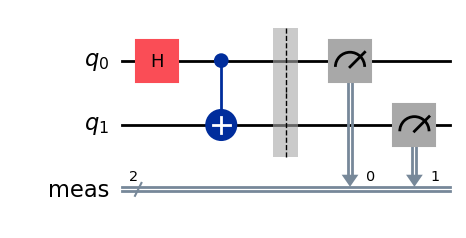

In [12]:
# Create a Bell circuit
bell_meas = QuantumCircuit(2)
bell_meas.h(0)
bell_meas.cx(0, 1)

# Display the quantum state of the Bell circuit
display(Statevector(bell_meas).draw('latex'))

# Apply measurement instruction
bell_meas.measure_all()
display(bell_meas.draw('mpl'))

# Transpile to an ISA Circuit for the intended backend
isa_bell_meas_sim = transpile(bell_meas, backend)

# Construct pub and run
pub_bell_meas_sim = (isa_bell_meas_sim, )

Step 2. Initialize the Sampler primitive and execute the pub.

In [13]:
# Initialize a sampler for the backend and run
sampler = Sampler(backend)
job_bell_meas_sim = sampler.run([pub_bell_meas_sim], shots=10)

# Extract results
result_bell_meas_sim = job_bell_meas_sim.result()
data_bell_meas_sim = result_bell_meas_sim[0].data
data_bell_meas_sim

DataBin(meas=BitArray(<shape=(), num_shots=10, num_bits=2>))

Step3. Get the results.

In [15]:
bits_sim = data_bell_meas_sim.meas

# shape: given by the input PUB parameter shape
print("shape:", bits_sim.shape)

# num_bits: the size of the input circuits classical register
print("num_bits:", bits_sim.num_bits)

# num_shots: the number of shots per parameterization
print("num_shots:", bits_sim.num_shots)

# array: the internal result data as a packed arrays of unit8(byte) values
print("array:\n", bits_sim.array)

shape: ()
num_bits: 2
num_shots: 10
array:
 [[0]
 [3]
 [3]
 [3]
 [3]
 [3]
 [3]
 [0]
 [0]
 [3]]


In [16]:
print("bitstrings:", bits_sim.get_bitstrings())
print("counts:", bits_sim.get_counts())

bitstrings: ['00', '11', '11', '11', '11', '11', '11', '00', '00', '11']
counts: {'00': 3, '11': 7}


#### Example 2: Using a Real Quantum Computer

In [18]:
# Select a backend
backend = service.backend('ibm_brisbane')

# backend = service.least_busy(operational=True, simulator=False)

<IPython.core.display.Latex object>

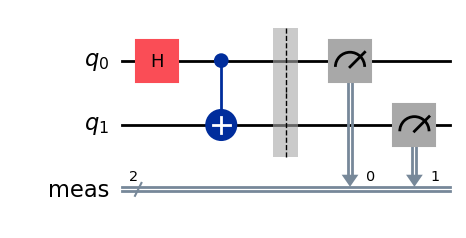

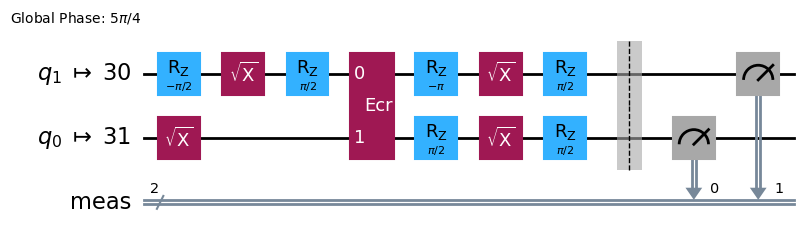

In [19]:
# Create a Bell circuit
bell_meas = QuantumCircuit(2)
bell_meas.h(0)
bell_meas.cx(0, 1)

# Display the quantum state of the Bell circuit
display(Statevector(bell_meas).draw('latex'))

# Apply measurement instruction
bell_meas.measure_all()
display(bell_meas.draw('mpl'))

# Transpile to an ISA Circuit for the intended backend
isa_bell_meas_real = transpile(bell_meas, backend)

# Construct pub and run
pub_bell_meas_real = (isa_bell_meas_real, )

# Draw ISA circuit
isa_bell_meas_real.draw('mpl', idle_wires=False)

In [20]:
# Initialize a sampler for the backend and run
sampler = Sampler(backend)
job_bell_meas_real = sampler.run([pub_bell_meas_real], shots=10)

# Extract results
result_bell_meas_real = job_bell_meas_real.result()
data_bell_meas_real = result_bell_meas_real[0].data
data_bell_meas_real

DataBin(meas=BitArray(<shape=(), num_shots=10, num_bits=2>))

In [21]:
bits_real = data_bell_meas_real.meas
# For some backends(ex. ibm_sherbrooke), you need to use 'c' instead of 'meas'
# ex) bits_real = data_bell_meas_real.c

# shape: given by the input PUB parameter shape
print("shape:", bits_real.shape)

# num_bits: the size of the input circuits classical register
print("num_bits:", bits_real.num_bits)

# num_shots: the number of shots per parameterization
print("num_shots:", bits_real.num_shots)

# array: the internal result data as a packed arrays of unit8(byte) values
print("array:\n", bits_real.array)

shape: ()
num_bits: 2
num_shots: 10
array:
 [[3]
 [3]
 [3]
 [0]
 [3]
 [0]
 [3]
 [0]
 [3]
 [3]]


In [22]:
print("bitstrings:", bits_real.get_bitstrings())
print("counts:", bits_real.get_counts())

bitstrings: ['11', '11', '11', '00', '11', '00', '11', '00', '11', '11']
counts: {'11': 7, '00': 3}


I mentioned earlier that I would explain what ISA circuit and Parametric circuit are when describing the elements that make up Sampler Pubs. Now, it's time to explain them!

#### What is an ISA Circuit?

Now, let's explain what an ISA circuit is! An ISA circuit refers to a QuantumCircuit object that satisfies the following three conditions:
1. The same number of qubits as the quantum computer selected as the backend.
2. Only the basis gates of the selected quantum computer as the backend.
3. The connectivity requirements of the selected quantum computer are met.

If you have created a quantum circuit at an abstract or logical level, you must convert it into an ISA circuit suitable for the backend through a process called *transpilation*.

Actual quantum computers cannot apply all quantum gates to qubits. They can only apply a few quantum gates that belong to a [universal quantum gate set](https://en.wikipedia.org/wiki/Quantum_logic_gate#Universal_quantum_gates), which are referred to as the **basis gates** of the quantum computer. Therefore, the gates in the initially created quantum circuit need to be decomposed into basis gates and optimized.

Additionally, IBM Quantum's quantum computers are composed of superconducting qubits. These superconducting quantum computers can only interact with neighboring qubits. Thus, the connectivity of these qubits must be considered, and the qubits in the logical quantum circuit need to be mapped appropriately to the qubits in the actual quantum computer. Swap gates must also be added if necessary.

When the quantum circuit we first created goes through these processes, it becomes an ISA circuit.

#### What is a Parametric Circuit?

A parametric circuit refers to a quantum circuit that includes gates with parameters that are not yet fixed. These types of circuits are commonly used in Variational Quantum Algorithms (VQA) and Quantum Machine Learning (QML). Below is an example of such a circuit.

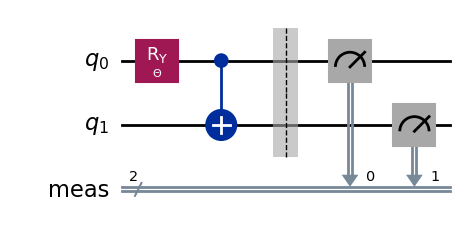

In [23]:
from qiskit.circuit import Parameter

# create the parameter
theta = Parameter('Θ')
par_bell_meas = QuantumCircuit(2)

# parameterize the rotation
par_bell_meas.ry(theta, 0)
par_bell_meas.cx(0, 1)

par_bell_meas.measure_all()

par_bell_meas.draw('mpl')

If you want to assign specific values to the parameters of a parametric circuit, you can do so as follows:

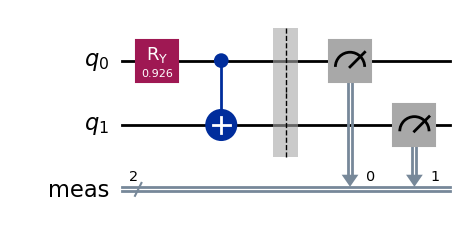

In [24]:
bc = par_bell_meas.assign_parameters({theta: 0.926})

bc.draw('mpl')

Parametric circuit 을 Sampler V2 를 이용하여 실행시키는 예시 코드는 다음과 같습니다.

In [27]:
import numpy as np

# Parameter values to evaluate with 20 theta values
param_vals = np.linspace(0, np.pi, 20)

# Transpile to an ISA Circuit for the intended backend
backend = AerSimulator()
sampler = Sampler(backend)
isa_par_bell_meas = transpile(par_bell_meas, backend)

# Construct pub and run
# Pub and result shape is (20,)
pub_par_bell_meas = (isa_par_bell_meas, param_vals)
job_par_bell_meas = sampler.run([pub_par_bell_meas], shots = 1000)
result_par_bell_meas = job_par_bell_meas.result()

# Extract creg(classical register) data
bits = result_par_bell_meas[0].data.meas
bits

BitArray(<shape=(20,), num_shots=1000, num_bits=2>)

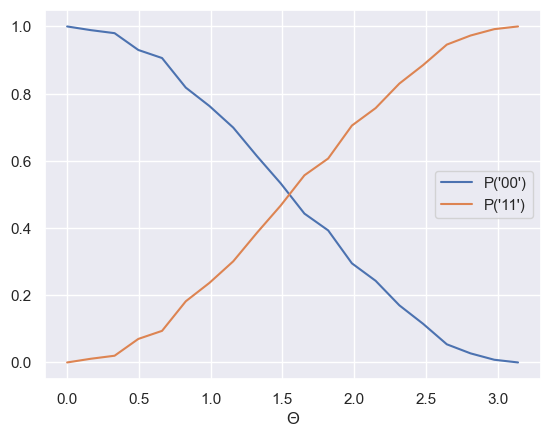

In [28]:
import matplotlib.pyplot as plt
import seaborn
seaborn.set()

# Compute the probability of "00" outcome and "11" outcome
p0s = np.sum(bits.array == 0, axis=1) / bits.num_shots
p1s = np.sum(bits.array == 3, axis=1) / bits.num_shots

plt.plot(param_vals, p0s, label="P('00')")
plt.plot(param_vals, p1s, label="P('11')")
plt.xlabel("Θ")
plt.legend()
plt.show()

Why does the result turn out this way? You can understand the answer by thinking about the role of the RY gate.

By running the following code cell, you can observe how the quantum state changes as the RY gate is applied up to an angle of pi.

In [29]:
from qiskit.visualization import visualize_transition

qc = QuantumCircuit(1)
qc.ry(np.pi, 0)

visualize_transition(qc)

C:\Users\Goseumdochy\AppData\Local\Temp\ipykernel_20016\3611026475.py:6: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of qiskit 1.2.0. It will be removed in the 2.0 release.
  visualize_transition(qc)


### Estimator V2

The Estimator primitive can be considered a higher-level primitive compared to the Sampler primitive. It is used when you want to estimate the expected value of a quantum state measurement after passing a quantum circuit through a given observable. The Estimator primitive can be used to execute a quantum circuit via the `run` method as follows.

Here is the structure of the `run` method of the Estimator:

    Estimator.run(
        pubs: list[EstimatorPub],
        precision: float | None = None,
    ) -> Job[EstimatorResult]

The second parameter `precision` of the run method refers to the desired accuracy when estimating the expected value. The first parameter, pubs, differs slightly from the pubs in Sampler. Let's now explore what structure the pub should have when using the Estimator primitive.

#### Estimator Pubs

The pub for Estimator has the following tuple structure:

    pub = (
        circuit [required],
        observables [required],
        parameter_values [optional],
        precision [optional],
        )

- circuit: An ISA QuantumCircuit object without a measurement command.
- observables: The ISA observable to be measured.
- parameter_values: Tensor (ND-array) structure of parameter values for the Parametric circuit.
- precision: The desired estimation accuracy for each circuit, observable, and parameter value.

Based on the combination of these four elements (circuit, observables, parameter_values, precision), the possible input formats for the Estimator pub are as follows:

1. (parametric_isa_circuit, isa_observables, parameter_values, precision)
2. (parametric_isa_circuit, isa_observables, parameter_values)
3. (non_parametric_isa_circuit, isa_observables, None, precision)
4. (non_parametric_isa_circuit, isa_observables)


#### Estimator Observables

An observable must be a *Hermitian operator* that is expressed as a linear combination of Pauli operators. A *single Pauli* operator is represented by a string of I, X, Y, and Z terms. In Qiskit, it can be declared using `quantum_info.Pauli`.

Additionally, a *Pauli operators list* (in the form of list[Pauli]) can be declared in Qiskit using `quantum_info.PauliList`.

#### Example 1: Non parametric circuit

In [30]:
# Select the FakeOurenseV2 as backend
# FakeOurenseV2 is 5-qubit fake backend
from qiskit_ibm_runtime.fake_provider import FakeOurenseV2

backend = FakeOurenseV2()

Step 1. Create a quantum circuit and transpile it into an ISA circuit

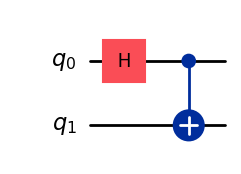

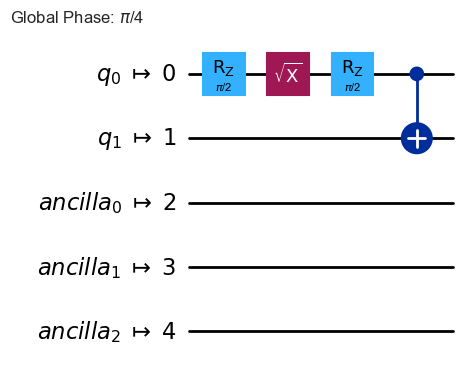

In [32]:
# Create a Bell circuit
bell = QuantumCircuit(2)
bell.h(0)
bell.cx(0, 1)
display(bell.draw("mpl"))

# Transpile to an ISA Circuit for the intended backend
isa_bell = transpile(bell, backend)

isa_bell.draw('mpl')

Step 2. Declare the observable and create the ISA observable according to the layout of the ISA circuit

In [35]:
import qiskit.quantum_info as qi

# Create an observable
obs = qi.SparsePauliOp(["ZZ"])

# Transpile to ISA observable for intended ISA circuit
isa_obs = obs.apply_layout(isa_bell.layout)
isa_obs

SparsePauliOp(['IIIZZ'],
              coeffs=[1.+0.j])

Step 3. Initialize the Estimator primitive and execute the pub

In [37]:
# Construct Estimator
estimator = Estimator(backend)

# Construct pub and run
pub = (isa_bell, isa_obs)
est_job_bell = estimator.run([pub])
est_result_bell = est_job_bell.result()

In [38]:
data = est_result_bell[0].data

# evs: The mean expectation value estimates for all input pub parameter values and observables.
evs = data.evs

# stds: The standard error of the mean of expectation value estimates.
stds = data.stds
print(f"<ZZ> = {evs:.3f} ± {stds:.3f}")

<ZZ> = 0.915 ± 0.006


#### Example 2: Parametric Circuit

In [39]:
from qiskit.circuit import Parameter
from qiskit_ibm_runtime.fake_provider import FakeOurenseV2
import numpy as np

backend = FakeOurenseV2()

# Construct Estimator
estimator = Estimator(backend)

# Parameterized bell circuit with multiple observables
theta = Parameter('Θ')
par_bell = QuantumCircuit(2)
par_bell.ry(theta, 0)
par_bell.cx(0, 1)

# Transpile to an ISA Circuit for the intended backend
isa_par_bell = transpile(par_bell, backend)

# Parameter values to evaluate with 20 theta values
param_vals = np.linspace(0, np.pi, 20)

# Create an observable array with 3 observables
par_bell_obs = [
    qi.SparsePauliOp(["XX"]),
    qi.SparsePauliOp(["YY"]),
    qi.SparsePauliOp(["ZZ"]),
]

# Transpile to ISA observable and reshape to (3, 1) array for broadcasting
isa_par_bell_obs = [
    [op.apply_layout(isa_par_bell.layout)] for op in par_bell_obs
]

# Construct pub and run
# Pub and result shape is (2, 20)
pub = (isa_par_bell, isa_par_bell_obs, param_vals, 0.01)

In [40]:
# Run estimator
est_job_par_bell = estimator.run([pub])
est_result_par_bell = est_job_par_bell.result()
evs = est_result_par_bell[0].data.evs
stds = est_result_par_bell[0].data.stds

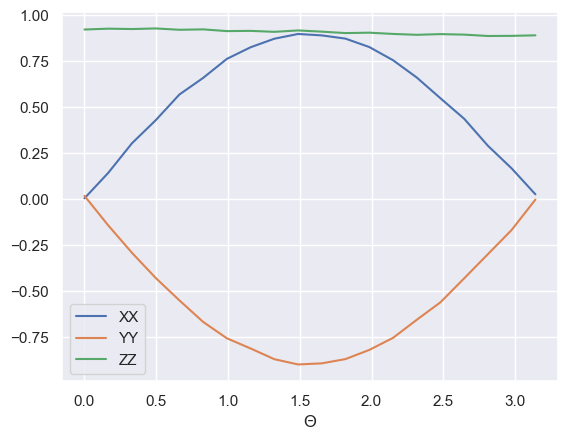

In [41]:
import matplotlib.pyplot as plt

# Compute the probability of "00" outcome and "11" outcome
plt.plot(param_vals, evs[0], label="XX")
plt.plot(param_vals, evs[1], label="YY")
plt.plot(param_vals, evs[2], label="ZZ")
plt.xlabel("Θ")
plt.legend()
plt.show()